In [1]:
%load_ext autoreload
%autoreload 2

%load_ext autotime

%cd ..

/Users/rubenbroekx/Documents/Projects/few-shot-face-classification
time: 1.49 ms (started: 2021-07-18 12:41:27 +02:00)


# TODO

In [2]:
import matplotlib.pyplot as plt

from glob import glob
from PIL import Image
from pathlib import Path
from src.few_shot_face_classification.utils import get_class
from src.few_shot_face_classification.data import load_folder, load_single, get_im_paths
from src.few_shot_face_classification.embed import validate_face, get_networks, embed, embed_batch, embed_folder
from src.few_shot_face_classification.similarity import export
from src.few_shot_face_classification.main import detect_and_export, recognise

time: 1.24 s (started: 2021-07-18 12:41:28 +02:00)


## Data

Load in all data.

In [3]:
# Place where raw dump of images is stored
DATA_RAW = Path.cwd() / 'demo/raw'
DATA_RAW.mkdir(exist_ok=True, parents=True)

# Place containing labeled faces
DATA_LABELED = Path.cwd() / 'demo/labeled'
DATA_LABELED.mkdir(exist_ok=True, parents=True)

# Place to which the results are stored
DATA_WRITE = Path.cwd() / 'demo/results/'
DATA_WRITE.mkdir(exist_ok=True, parents=True)

time: 1.61 ms (started: 2021-07-18 12:41:29 +02:00)


Found a total of 28 images


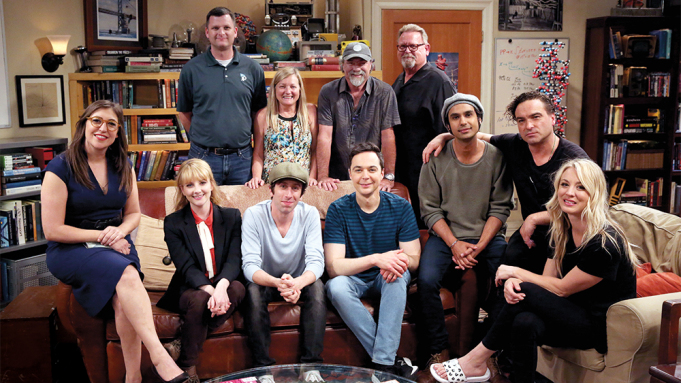

time: 144 ms (started: 2021-07-18 12:41:29 +02:00)


In [4]:
# Get the number of images in the folder
paths = get_im_paths(DATA_RAW)
print(f"Found a total of {len(paths)} images")

# Show an example image
load_single(paths[0])

## Validate Labels

Validate that the labeled images indeed contain a single face.

In [5]:
# Load in the networks used for validation
mtcnn, vggface2 = get_networks()

time: 356 ms (started: 2021-07-18 12:41:33 +02:00)


In [6]:
labeled = get_im_paths(DATA_LABELED)
print(f"Total of {len(labeled)} labeled faces")

for path in labeled:
    im = load_single(path)
    if not validate_face(im, val_single=True, mtcnn=mtcnn, vggface2=vggface2):
        raise Exception

Total of 10 labeled faces
time: 1.05 s (started: 2021-07-18 12:41:46 +02:00)


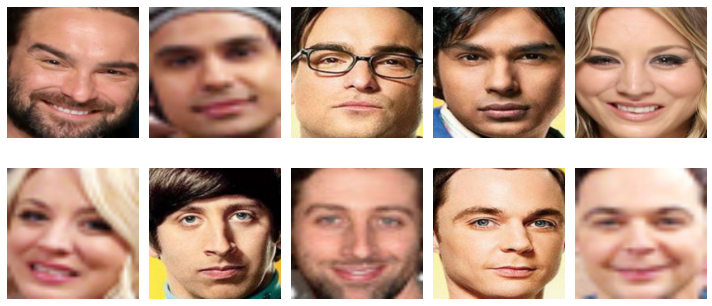

time: 550 ms (started: 2021-07-18 12:41:52 +02:00)


In [7]:
# Show several examples
plt.figure(figsize=(10,5))
for i, path in enumerate(labeled):
    plt.subplot(2,5,i+1)
    im = plt.imread(path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()

## Embed

Embed all the recognised faces using the VGGFace2 network.

In [8]:
# Embed the labeled data
labeled_paths, labeled_embs = embed_folder(DATA_LABELED)

Processing: 100%|███████████████████████████████████████████████████████████████| 10/10 [00:03<00:00,  2.78it/s]

time: 3.84 s (started: 2021-07-18 12:42:02 +02:00)


In [9]:
# Use seaborn to show the distance matrix
!pip install seaborn

time: 1.14 s (started: 2021-07-18 12:42:07 +02:00)


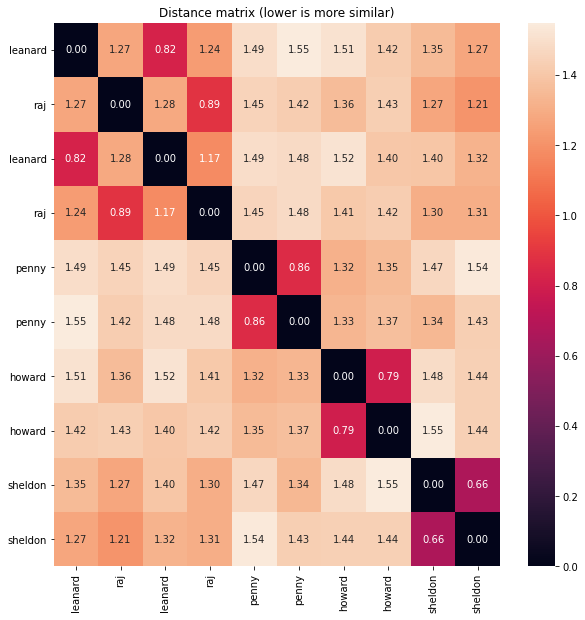

time: 946 ms (started: 2021-07-18 12:42:09 +02:00)


In [10]:
import seaborn as sns
from sklearn.metrics.pairwise import euclidean_distances

plt.figure(figsize=(10,10))
plt.title("Distance matrix (lower is more similar)")
dist = euclidean_distances(labeled_embs)
sns.heatmap(dist, annot=True, fmt='.2f')
plt.xticks(
    [i + .5 for i in range(len(labeled_paths))],
    [get_class(p) for p in labeled_paths],
    rotation=90,
)
plt.yticks(
    [i + .5 for i in range(len(labeled_paths))],
    [get_class(p) for p in labeled_paths],
    rotation=0,
)
plt.show()

In [11]:
# Embed the raw data
paths,embs = embed_folder(DATA_RAW)

Processing: 100%|███████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.04it/s]

time: 9.79 s (started: 2021-07-18 12:42:16 +02:00)


## Classification

Use the labeled data in order to distribute the raw images to the suiting classes (subfolders of the write directory).

In [12]:
# Export all images to the corresponding classes
export(
    paths=paths,
    embs=embs,
    labeled_paths=labeled_paths,
    labeled_embs=labeled_embs,
    write_f=DATA_WRITE,
)

time: 63.3 ms (started: 2021-07-18 12:42:32 +02:00)


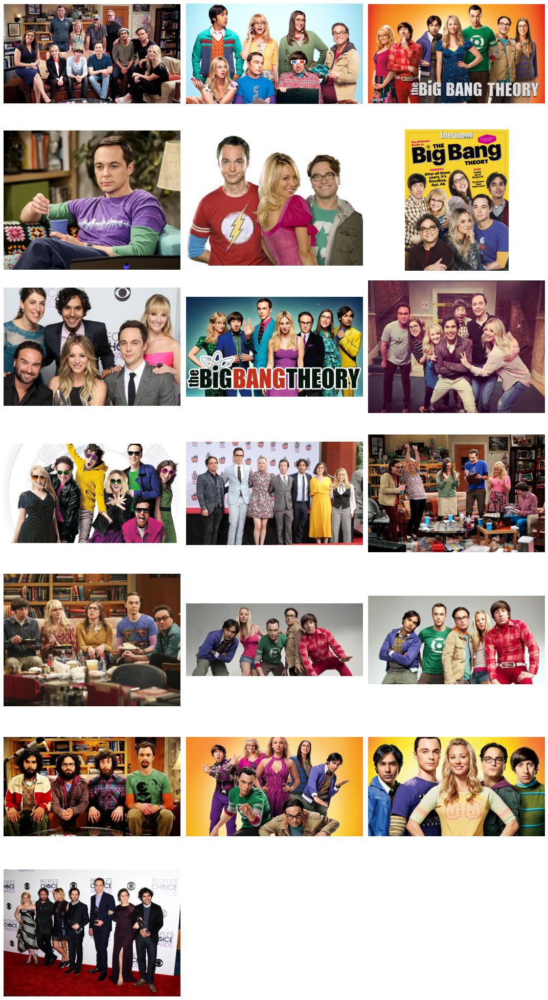

time: 3.86 s (started: 2021-07-18 12:45:07 +02:00)


In [17]:
# Visualise all images of a single class
cls = 'sheldon'

# Extract all images from that class
cls_paths = get_im_paths(DATA_WRITE / cls)

plt.figure(figsize=(5*3,4*(len(cls_paths)//3+1)))
for i, im_path in enumerate(cls_paths):
    plt.subplot(len(cls_paths)//3+1,3,i+1)
    im = plt.imread(im_path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()

time: 1.13 ms (started: 2021-07-18 12:27:20 +02:00)


In [40]:
# Perform A to Z classification on the raw map
detect_and_export(
    raw_f=DATA_RAW,
    labeled_f=DATA_LABELED,
    write_f=DATA_WRITE,
)

Processing: 100%|███████████████████████████████████████████████████████████████| 10/10 [00:09<00:00,  1.05it/s]

time: 13.9 s (started: 2021-07-18 12:29:44 +02:00)


time: 734 µs (started: 2021-07-18 12:33:51 +02:00)


Processing: 100%|███████████████████████████████████████████████████████████████| 10/10 [00:01<00:00,  5.15it/s]


Predicted classes: {'leanard', 'howard', 'sheldon'}


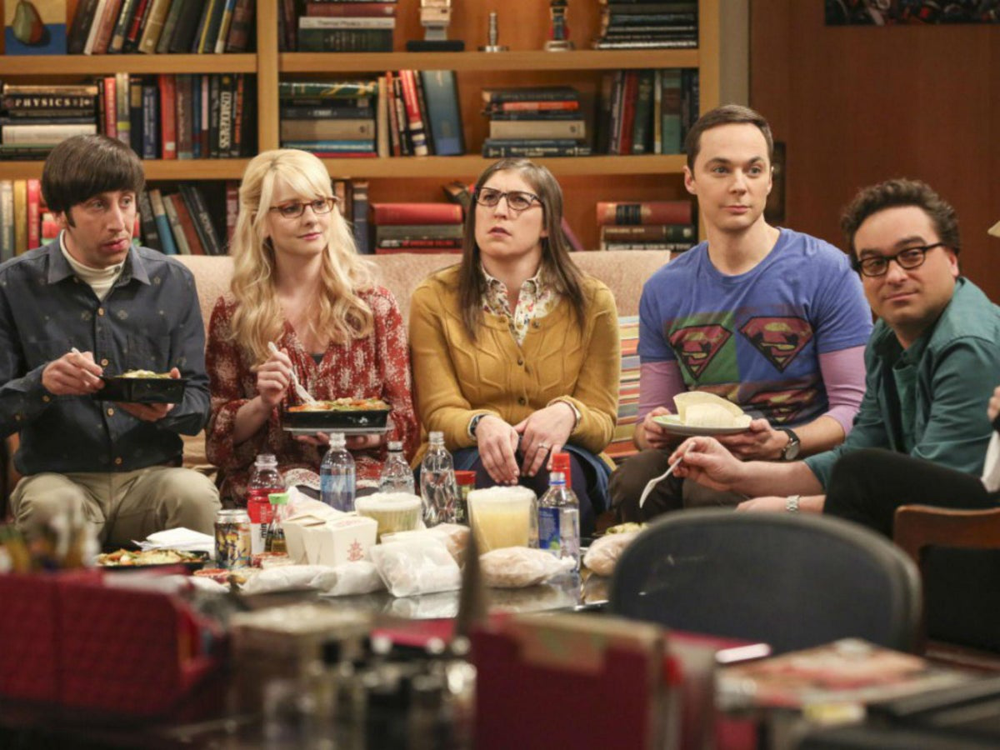

time: 4.29 s (started: 2021-07-18 12:35:14 +02:00)


In [44]:
im_path = Path.cwd() / 'demo/raw/group20.jpeg'
classes = recognise(
    path=im_path,
    labeled_f=DATA_LABELED,
)
print(f"Predicted classes: {classes}")
im = load_single(im_path)
im

In [20]:
# Similarity metric to use
METRIC = 'cosine'

# Supported metrices
assert METRIC in ('euclidean', 'cosine')

time: 727 µs (started: 2021-07-17 20:28:20 +02:00)


In [21]:
def _get_metric():
    """Get the pairwise metric to use."""
    if METRIC == 'cosine':
        return cosine_similarity
    elif METRIC == 'euclidean':
        return euclidean_distances
    else:
        raise Exception(f'Metric {METRIC} not supported!')

metric = _get_metric()

time: 1 ms (started: 2021-07-17 20:28:21 +02:00)


In [22]:
def get_most_similar(emb:np.ndarray) -> Tuple[str,float]:
    """Get the image's path together with the similarity threshold of the most similar image."""
    sim = metric([emb], embeddings)[0]
    best_sim = sim.max()
    return recognised[np.where(sim == best_sim)[0][0]], best_sim

def recognise(im:Image, thr:float=.5, debug:bool=False) -> Set[str]:
    """Recognise all class present in the image, ignore face if below certainty threshold or None-class."""
    embs = embed(im)
    classes = set()
    for emb in embs:
        pred,sim = get_most_similar(emb)
        cls = _get_class(pred)
        if sim >= thr and cls != 'none':
            classes.add(cls)
            
        # Debugging info if requested
        if debug:
            print(f"Predicted '{cls}' with certainty {sim}")
            print(f"  Best match: {pred}")
    return classes

time: 1.41 ms (started: 2021-07-17 20:28:22 +02:00)


Recognised classes: {'leanard', 'howard', 'sheldon'}


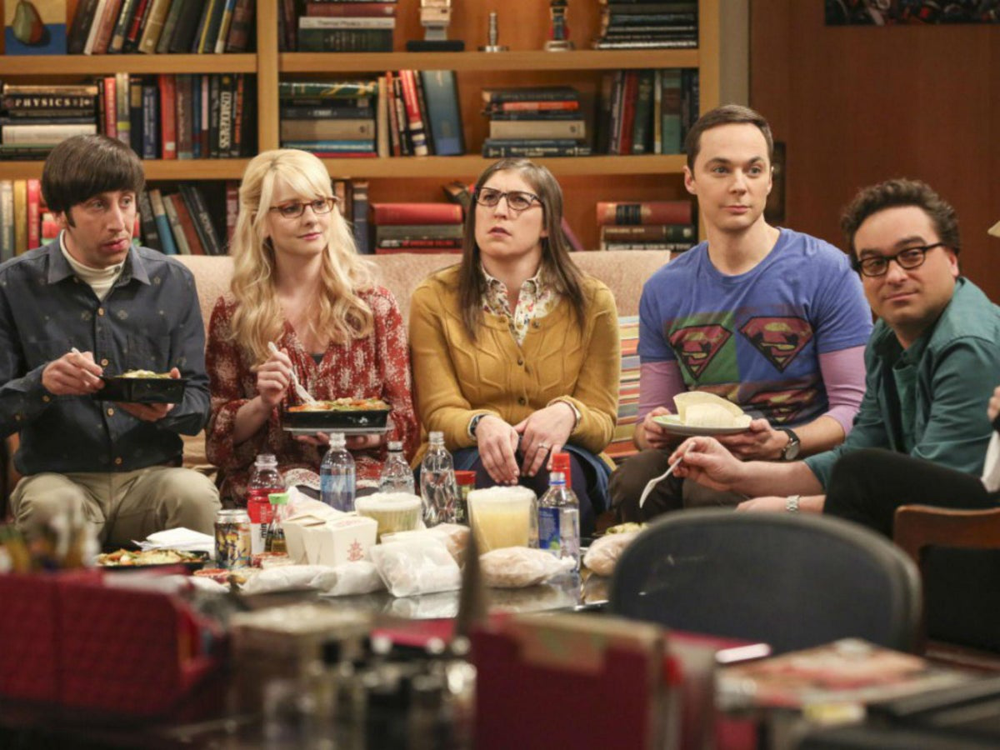

time: 1.8 s (started: 2021-07-17 20:28:24 +02:00)


In [23]:
im = Image.open(Path.cwd() / 'demo/data/group20.jpeg')
classes = recognise(im)
print(f"Recognised classes: {classes}")
im

## Interference

Get all images in which a certain face (class) is present.

In [24]:
CLASS = 'howard'

assert CLASS in CLASSES

time: 698 µs (started: 2021-07-17 20:28:29 +02:00)


In [25]:
image_paths = sorted(glob(str(Path.cwd() / 'demo/data/*.jpeg')))
has_class = []
for im_path in image_paths:
    im = Image.open(im_path)
    classes = recognise(im)
    if CLASS in classes:
        has_class.append(im_path)

time: 22.1 s (started: 2021-07-17 20:28:29 +02:00)


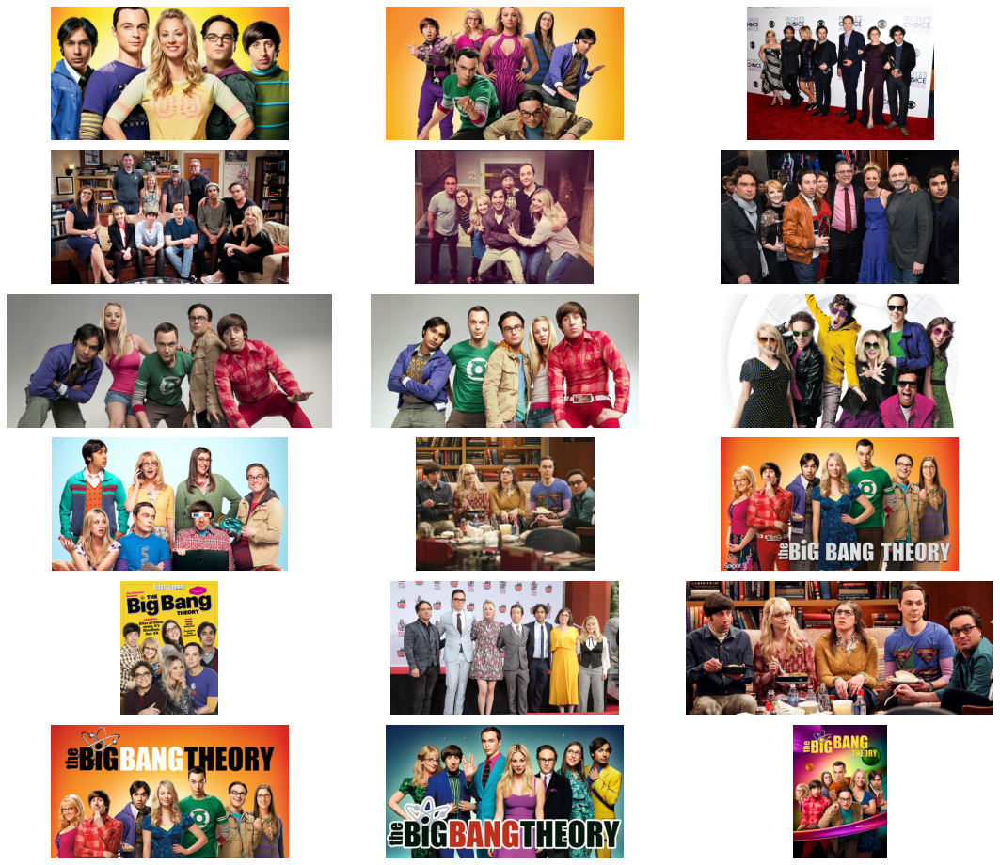

time: 2.96 s (started: 2021-07-17 20:28:51 +02:00)


In [26]:
# Show all images that have the requested class
plt.figure(figsize=(15,15))
for i, im_path in enumerate(has_class):
    plt.subplot(len(has_class)//3+1,3,i+1)
    im = plt.imread(im_path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()

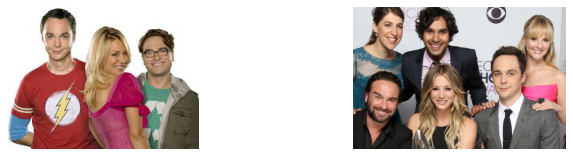

time: 268 ms (started: 2021-07-17 20:28:54 +02:00)


In [27]:
# Show all images that DO NOT have the requested class
plt.figure(figsize=(15,15))
for i, im_path in enumerate([path for path in image_paths if path not in has_class]):
    plt.subplot(len(has_class)//3+1,3,i+1)
    im = plt.imread(im_path)
    plt.imshow(im)
    plt.axis('off')
plt.tight_layout()